In [1]:
%load_ext autoreload
%autoreload 2

import os
import sys
from pathlib import Path
from collections import defaultdict
from drone_footage import DroneFlightPass, FlightDifference, PROJECT_ROOT

sys.path.append(PROJECT_ROOT)

MASTER_REF = PROJECT_ROOT / "data/2025-11-07/drone_imaging/2025-11-07T1248PST_ORTHO_NDVI.tif"
DATA_DIR = PROJECT_ROOT / "data/2025-11-07/drone_imaging/"

TEMPERATURE_TIMESTAMPS = [
    "2025-11-07T1109PST",
    "2025-11-07T1120PST",
    "2025-11-07T1151PST",
    "2025-11-07T1159PST",
    "2025-11-07T1214PST",
    "2025-11-07T1223PST",
    "2025-11-07T1232PST",
    "2025-11-07T1301PST",
    "2025-11-07T1312PST",
]
NUM_BANDS = 15

In [2]:
temperature_flight_passes : list[DroneFlightPass] = []
for ts in TEMPERATURE_TIMESTAMPS:
    flight_pass = DroneFlightPass(
        timestamp = ts, 
        master_reference_path = MASTER_REF,
        data_dir=DATA_DIR,
        verbose=False  
    )
    temperature_flight_passes.append(flight_pass)

ndvi_flight_pass = DroneFlightPass(
    timestamp = "2025-11-07T1133PST", 
    master_reference_path = MASTER_REF,
    data_dir=DATA_DIR    
)
vegetation_mask = ndvi_flight_pass.create_mask_from_feature("NDVI", 0.3)

Loaded drone flight pass for 2025-11-07T1133PST
Available channels (8):
   0: MS_band0
   1: MS_band1
   2: MS_band2
   3: MS_band3
   4: MS_band4
   5: MS_band5
   6: NDRE
   7: NDVI
Data shape: (8, 5132, 7656) (channels, height, width)


In [3]:
experimental_region_coords = [
    (620872, 4247530), 
    (621085, 4247530), 
    (621085, 4247350), 
    (620872, 4247287)
]
experimental_region_strip_bands = ndvi_flight_pass.strip_band(experimental_region_coords, NUM_BANDS)

experimental_regions = []
for strip_band in experimental_region_strip_bands:
    poly_mask = ndvi_flight_pass.create_mask_from_polygon(strip_band)
    experimental_regions.append([poly_mask, vegetation_mask])

In [4]:
control_region_coords = [
    (621120, 4247530), 
    (621120, 4247375), 
    (621175, 4247530), 
    (621175, 4247375)
]
control_region_mask = flight_pass.create_mask_from_polygon(control_region_coords)
control_region = [control_region_mask, vegetation_mask]

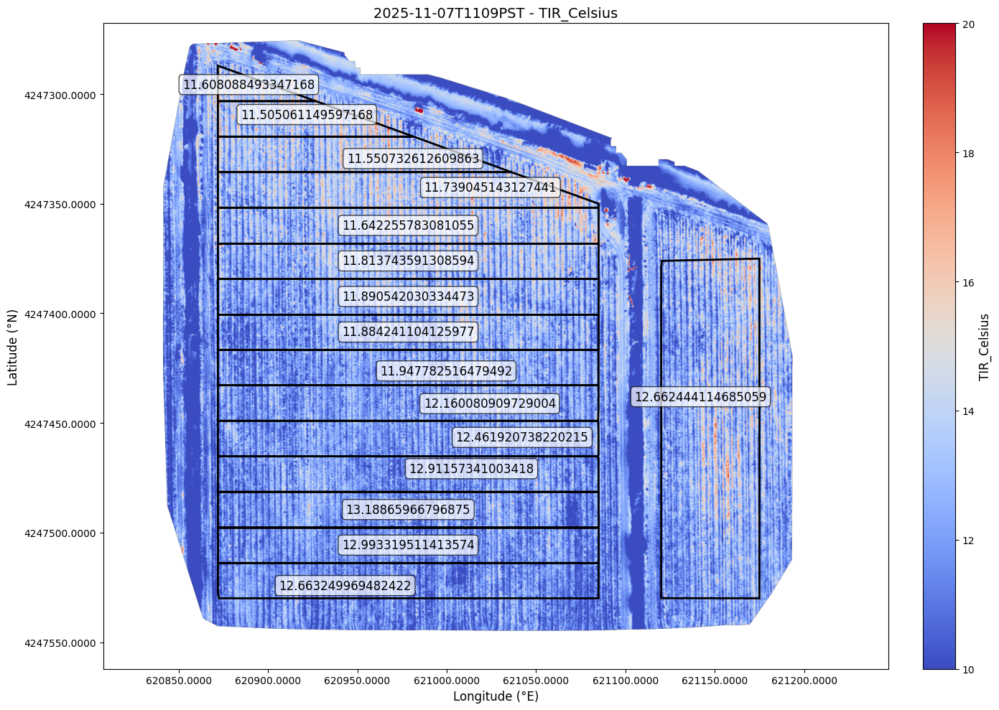

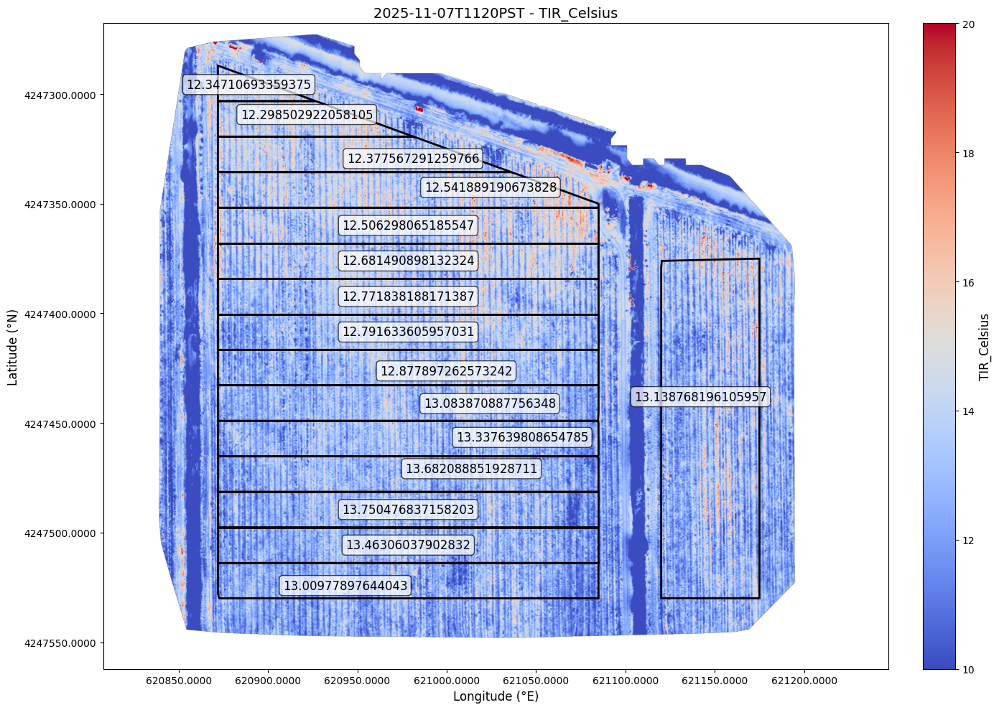

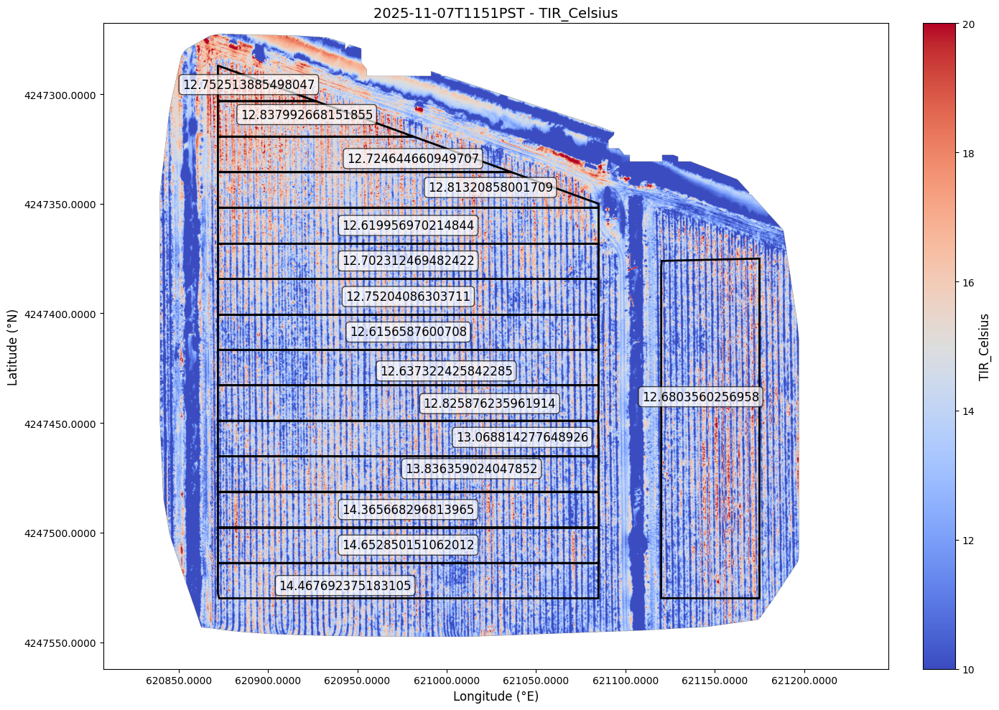

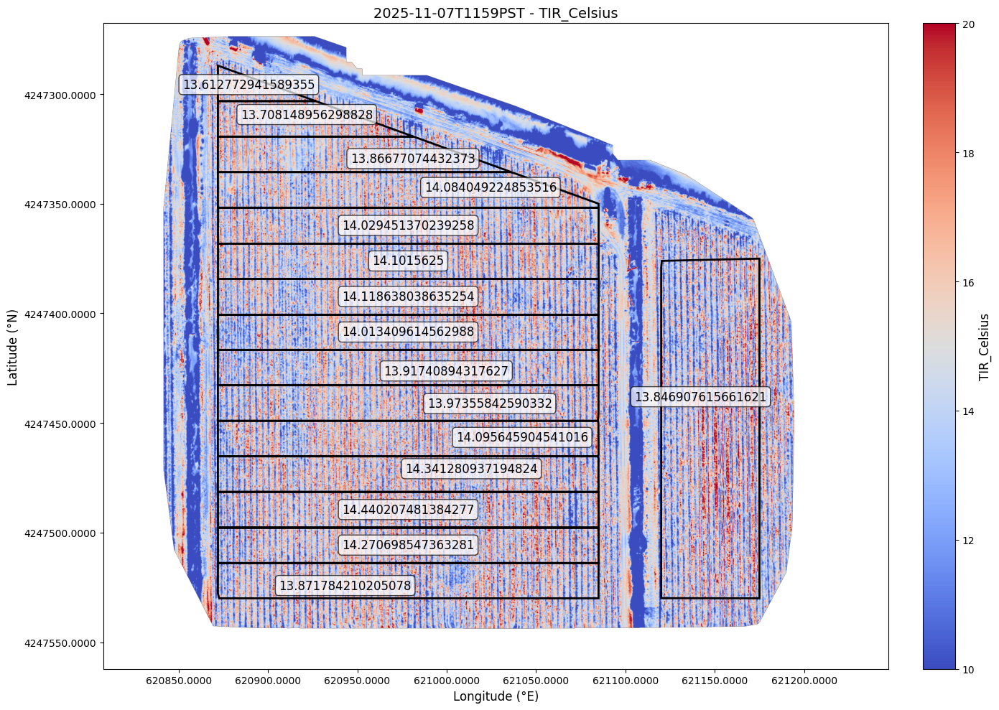

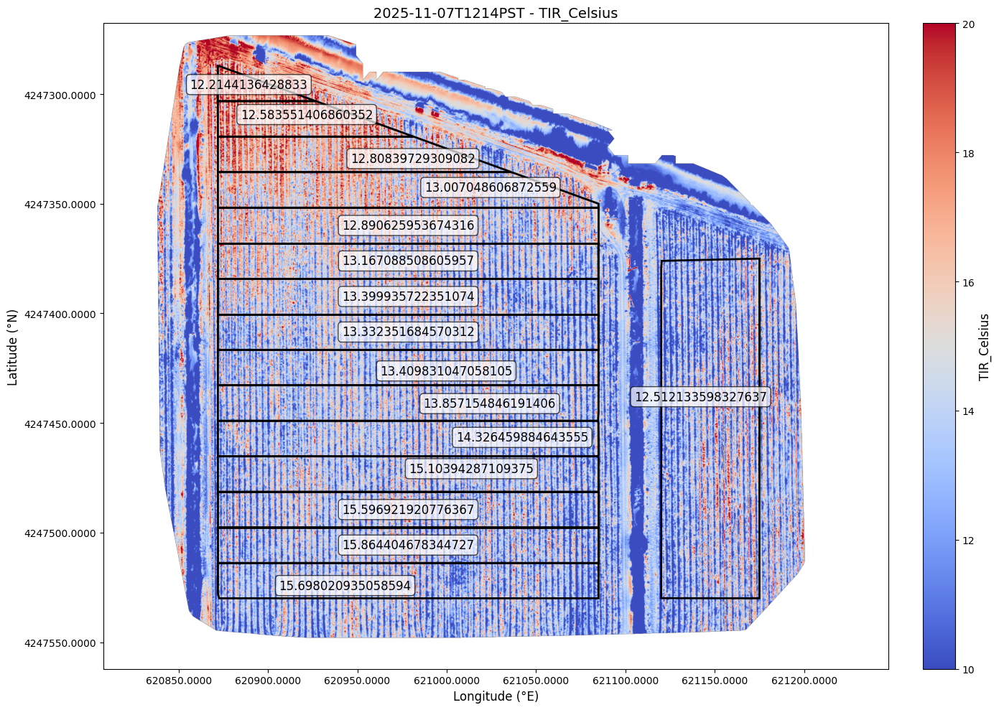

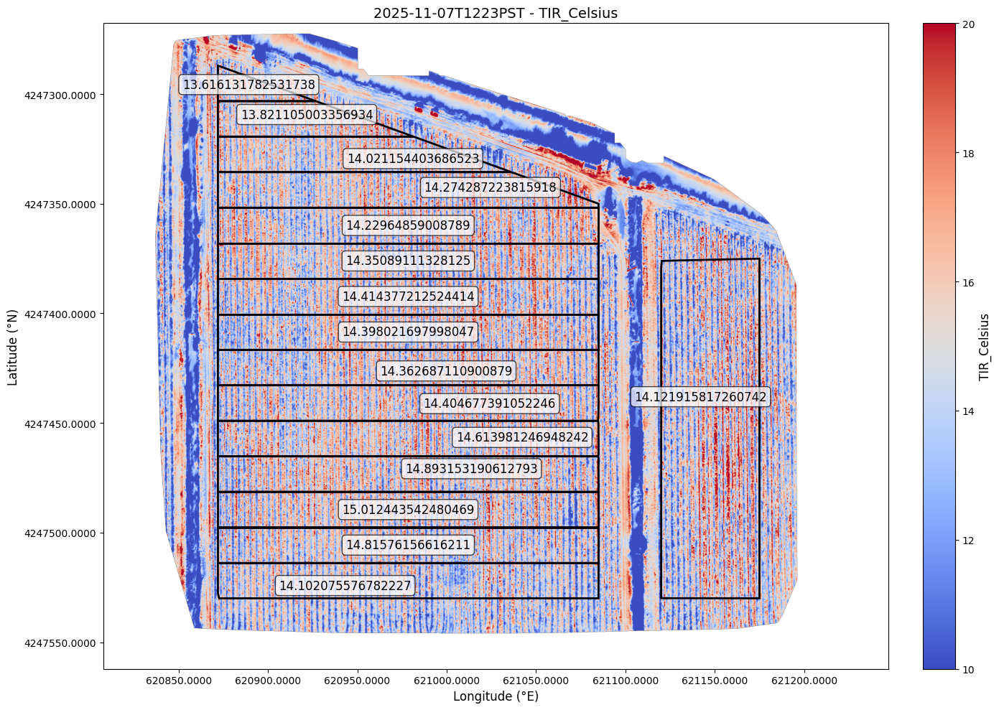

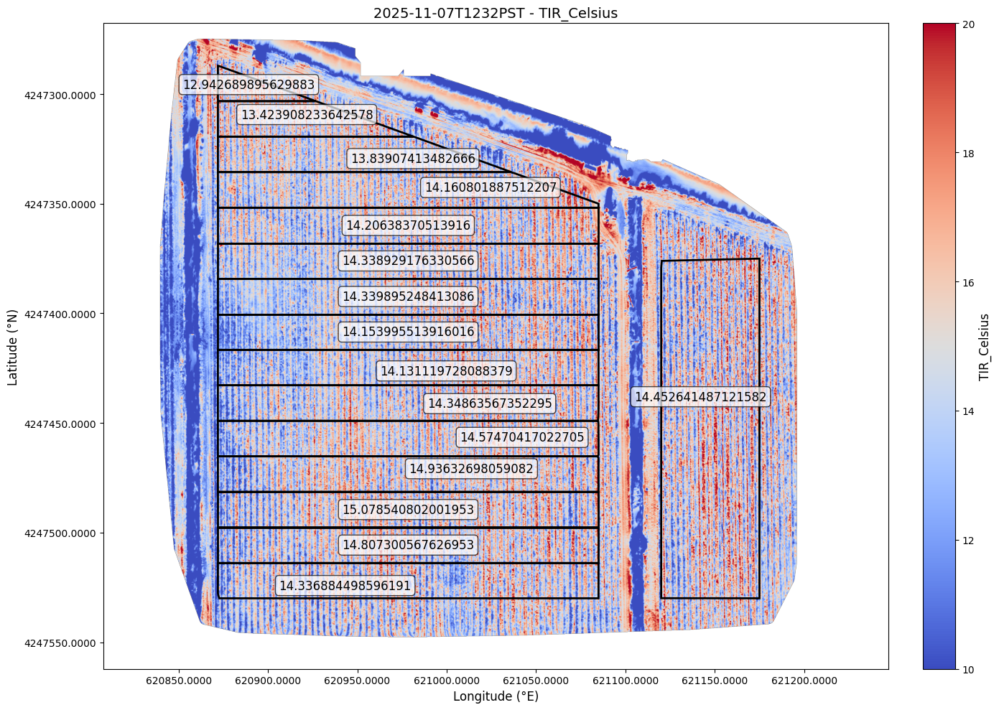

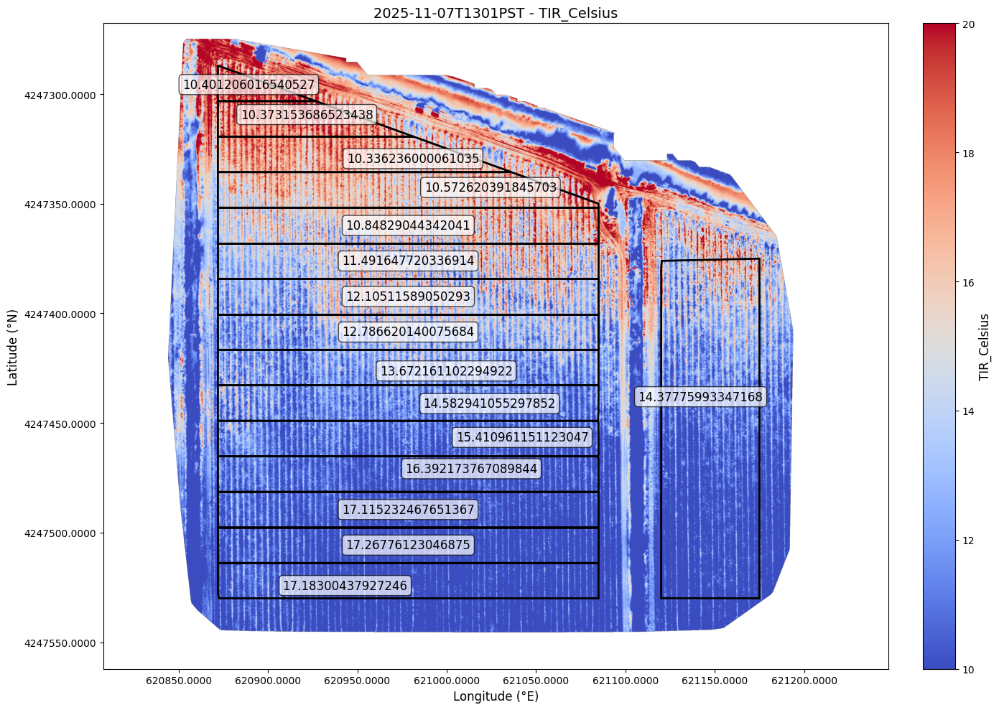

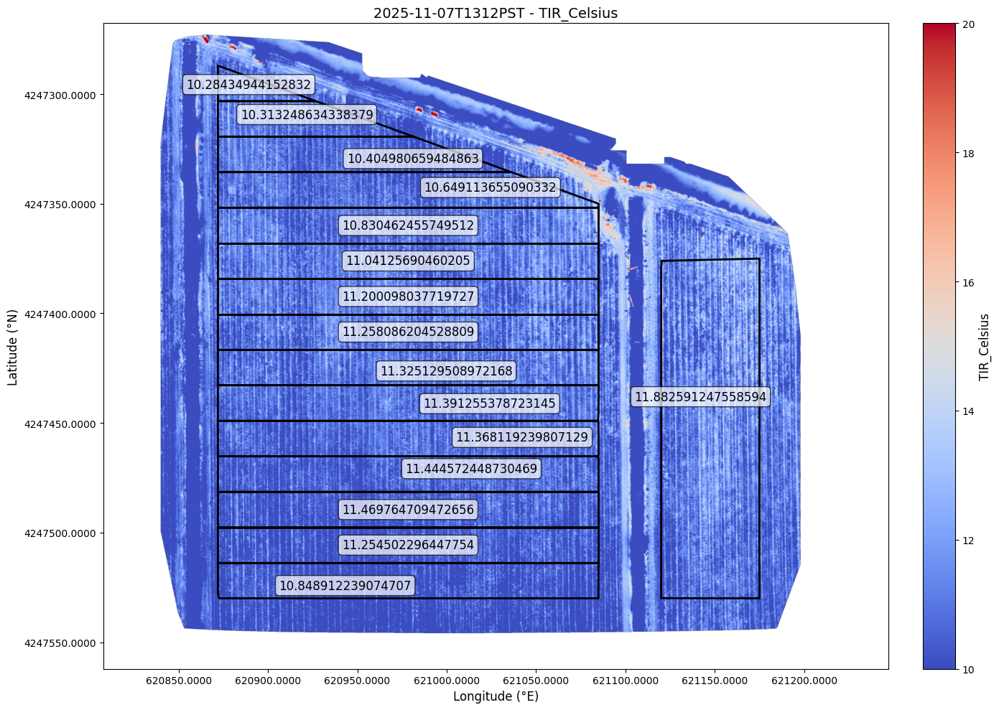

In [12]:
mean_temperatures = defaultdict(dict)

for flight_pass, timestamp in zip(temperature_flight_passes, TEMPERATURE_TIMESTAMPS):
    experimental_temperatures = flight_pass.query_regions(experimental_regions, "TIR_Celsius")
    for i, temp in enumerate(experimental_temperatures):
        mean_temperatures[timestamp][f"Experimental Band {i}"] = temp
    mean_temperatures[timestamp]["Control"] = flight_pass.query_regions([control_region], "TIR_Celsius")[0]


for flight_pass, timestamp in zip(temperature_flight_passes, TEMPERATURE_TIMESTAMPS):
    region_names = []
    for k, v in mean_temperatures[timestamp].items():
        region_names.append(f"{v}")
    figure = flight_pass.visualize(
        [
            *experimental_regions, 
            control_region
        ], 
        region_names, 
        "TIR_Celsius", 
        mean_center=False,
        vmin=10,
        vmax=20,
        show_fig=False
    )
    figure.savefig(PROJECT_ROOT / "plots/tif_temp_plots" / timestamp)

In [20]:
flight_difference_1 = FlightDifference(
    "2025-11-07T1109PST", "2025-11-07T1214PST", MASTER_REF, DATA_DIR
)

mean_temperatures = defaultdict(dict)
experimental_temperatures = flight_difference_1.query_regions(experimental_regions, "TIR_Celsius")
for i, temp in enumerate(experimental_temperatures):
    mean_temperatures["diff_1"][f"Experimental Band {i}"] = temp
mean_temperatures["diff_1"]["Control"] = flight_difference_1.query_regions([control_region], "TIR_Celsius")[0]

for k, v in mean_temperatures[timestamp].items():
    region_names.append(f"{v}")

figure = flight_difference_1.visualize(
    [
        *experimental_regions, 
        control_region
    ], 
    region_names, 
    "TIR_Celsius", 
    mean_center=False,
    show_fig=False
)
figure.savefig(PROJECT_ROOT / "plots/tif_temp_plots" / timestamp)

Initialized FlightDifference: 2025-11-07T1109PST -> 2025-11-07T1214PST
Common channels: {'TIR_Celsius'}


/Users/suhaschundi/Documents/Sunscreen/field_experiments/src/drone_footage.py:58: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  self.nodata_mask = None


ValueError: Image size of 7201471x9482553 pixels is too large. It must be less than 2^23 in each direction.

<Figure size 1400x1000 with 2 Axes>

In [10]:
flight_difference_2 = FlightDifference(
    "2025-11-07T1109PST", "2025-11-07T1223PST", MASTER_REF, DATA_DIR
)

Initialized FlightDifference: 2025-11-07T1109PST -> 2025-11-07T1223PST
Common channels: {'TIR_Celsius'}
